https://datahack.analyticsvidhya.com/contest/janatahack-mobility-analytics/True/#LeaderBoard

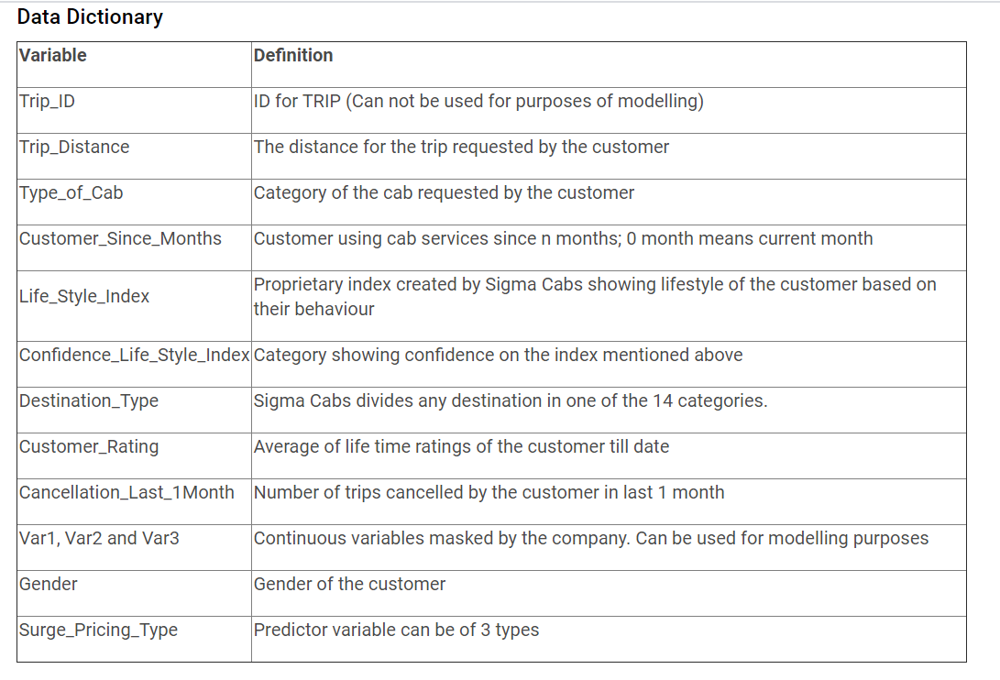

# Uploading Files

In [1]:
from google.colab import files
files.upload()

Saving ss.csv to ss.csv
Saving test.csv to test.csv
Saving train.csv to train.csv


{'ss.csv': b'Trip_ID,Surge_Pricing_Type\r\nT0005689459,2\r\nT0005689462,2\r\nT0005689463,2\r\nT0005689466,2\r\nT0005689468,2\r\nT0005689471,2\r\nT0005689476,2\r\nT0005689478,2\r\nT0005689480,2\r\nT0005689481,2\r\nT0005689483,2\r\nT0005689488,2\r\nT0005689489,2\r\nT0005689490,2\r\nT0005689494,2\r\nT0005689495,2\r\nT0005689499,2\r\nT0005689500,2\r\nT0005689511,2\r\nT0005689512,2\r\nT0005689514,2\r\nT0005689518,2\r\nT0005689524,2\r\nT0005689526,2\r\nT0005689527,2\r\nT0005689528,2\r\nT0005689531,2\r\nT0005689535,2\r\nT0005689540,2\r\nT0005689541,2\r\nT0005689549,2\r\nT0005689550,2\r\nT0005689552,2\r\nT0005689555,2\r\nT0005689557,2\r\nT0005689560,2\r\nT0005689563,2\r\nT0005689565,2\r\nT0005689572,2\r\nT0005689575,2\r\nT0005689579,2\r\nT0005689580,2\r\nT0005689585,2\r\nT0005689587,2\r\nT0005689588,2\r\nT0005689589,2\r\nT0005689593,2\r\nT0005689594,2\r\nT0005689596,2\r\nT0005689599,2\r\nT0005689601,2\r\nT0005689603,2\r\nT0005689604,2\r\nT0005689606,2\r\nT0005689607,2\r\nT0005689609,2\r\nT0005

# Importing data and libraries

In [575]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.simplefilter('ignore')

In [576]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
ss = pd.read_csv('ss.csv')

train.shape, test.shape, ss.shape

((131662, 14), (87395, 13), (87395, 2))

# Data

In [577]:
train.head()

,Trip_ID,Trip_Distance,Type_of_Cab,Customer_Since_Months,Life_Style_Index,Confidence_Life_Style_Index,Destination_Type,Customer_Rating,Cancellation_Last_1Month,Var1,Var2,Var3,Gender,Surge_Pricing_Type
0,T0005689460,6.77,B,1.0,2.42769,A,A,3.90500,0,40.0,46,60,Female,2
1,T0005689461,29.47,B,10.0,2.78245,B,A,3.45000,0,38.0,56,78,Male,2
2,T0005689464,41.58,NaN,10.0,NaN,NaN,E,3.50125,2,NaN,56,77,Male,2
3,T0005689465,61.56,C,10.0,NaN,NaN,A,3.45375,0,NaN,52,74,Male,3
4,T0005689467,54.95,C,10.0,3.03453,B,A,3.40250,4,51.0,49,102,Male,2


In [578]:
ss.head()

,Trip_ID,Surge_Pricing_Type
0,T0005689459,2
1,T0005689462,2
2,T0005689463,2
3,T0005689466,2
4,T0005689468,2


In [579]:
train.nunique()

Trip_ID                        131662
Trip_Distance                   10326
Type_of_Cab                         5
Customer_Since_Months              11
Life_Style_Index                55978
Confidence_Life_Style_Index         3
Destination_Type                   14
Customer_Rating                  3931
Cancellation_Last_1Month            9
Var1                              122
Var2                               58
Var3                               96
Gender                              2
Surge_Pricing_Type                  3
dtype: int64

In [580]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131662 entries, 0 to 131661
Data columns (total 14 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Trip_ID                      131662 non-null  object 
 1   Trip_Distance                131662 non-null  float64
 2   Type_of_Cab                  111452 non-null  object 
 3   Customer_Since_Months        125742 non-null  float64
 4   Life_Style_Index             111469 non-null  float64
 5   Confidence_Life_Style_Index  111469 non-null  object 
 6   Destination_Type             131662 non-null  object 
 7   Customer_Rating              131662 non-null  float64
 8   Cancellation_Last_1Month     131662 non-null  int64  
 9   Var1                         60632 non-null   float64
 10  Var2                         131662 non-null  int64  
 11  Var3                         131662 non-null  int64  
 12  Gender                       131662 non-null  object 
 13 

In [581]:
ID_COL, TARGET_COL = 'Trip_ID', 'Surge_Pricing_Type'

# Target Distribution

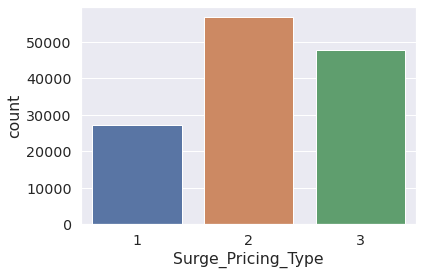

In [582]:
sns.countplot(train['Surge_Pricing_Type'])

# % of NaN values 

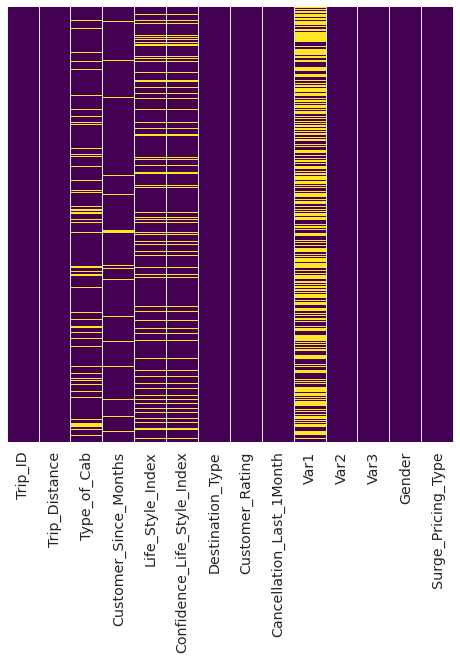

In [583]:
plt.figure(figsize=(8,8))
sns.heatmap(train.isnull(),cmap='viridis',cbar=False,yticklabels=False)

In [584]:
null_values_per_variable = 100 * (train.isnull().sum()/train.shape[0]).round(3)#.reset_index()
null_values_per_variable.sort_values(ascending=False)

Var1                           53.9
Confidence_Life_Style_Index    15.3
Life_Style_Index               15.3
Type_of_Cab                    15.3
Customer_Since_Months           4.5
Surge_Pricing_Type              0.0
Gender                          0.0
Var3                            0.0
Var2                            0.0
Cancellation_Last_1Month        0.0
Customer_Rating                 0.0
Destination_Type                0.0
Trip_Distance                   0.0
Trip_ID                         0.0
dtype: float64

# Numerical and Categorical Features

In [585]:
features = [c for c in train.columns if c not in [ID_COL, TARGET_COL]]
cat_cols = train.select_dtypes(include=['object'])

# categorical features
cat_cols = [c for c in features if c in cat_cols]

# numerical features
num_cols = [n for n in features if n not in cat_cols]

print('categorical variables')
display(cat_cols)
print('numerical variables')
display(num_cols)

categorical variables


['Type_of_Cab', 'Confidence_Life_Style_Index', 'Destination_Type', 'Gender']

numerical variables


['Trip_Distance',
 'Customer_Since_Months',
 'Life_Style_Index',
 'Customer_Rating',
 'Cancellation_Last_1Month',
 'Var1',
 'Var2',
 'Var3']

# Outliers 

Trip_Distance
0
Customer_Since_Months
1
Life_Style_Index
2
Customer_Rating
3
Cancellation_Last_1Month
4
Var1
5
Var2
6
Var3
7


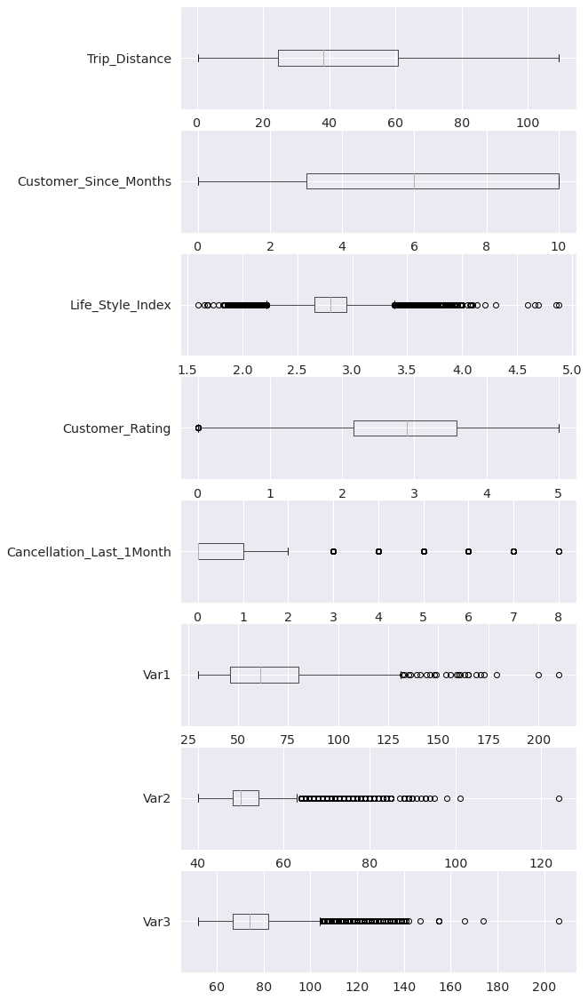

In [543]:
fig, axes = plt.subplots(8, 1, figsize=(8, 20))
for i, c in enumerate(num_cols):
        print(c)
        print(i)
        _ = train[[c]].boxplot(ax=axes[i], vert=False)

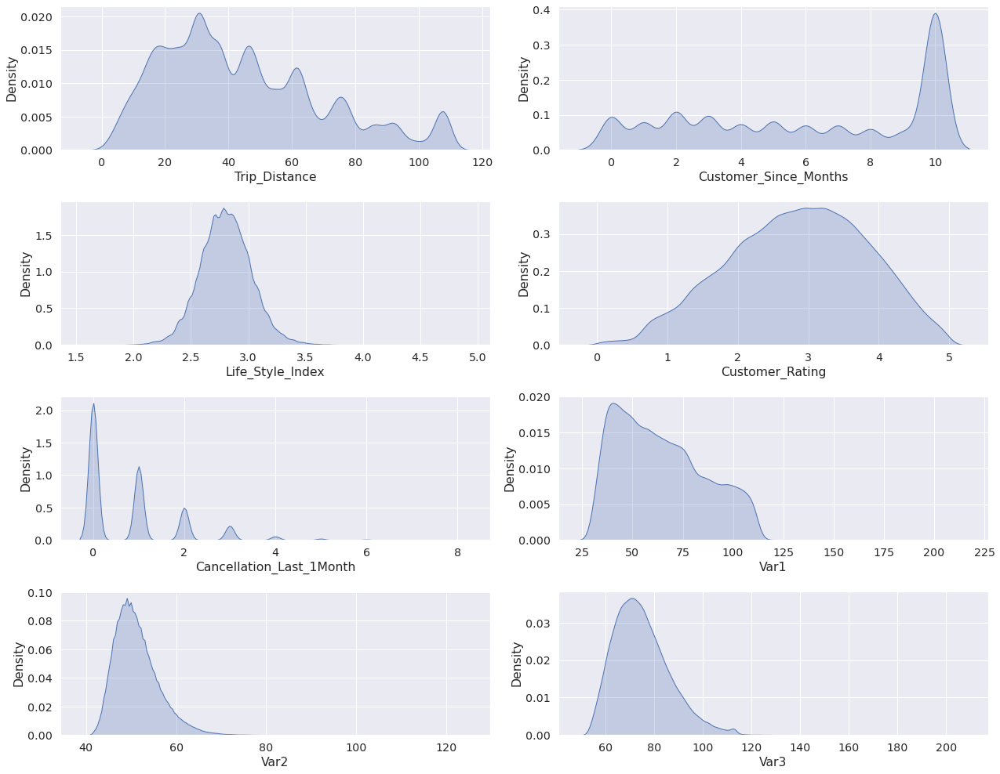

In [544]:
sns.set(font_scale=1.3)
fig, axes = plt.subplots(4, 2, figsize=(18, 14))
axes = [ax for axes_row in axes for ax in axes_row]
for i, c in enumerate(num_cols):
  plot = sns.kdeplot(data=train, x=c, ax=axes[i], fill=True)
plt.tight_layout()

In [545]:
train.Var1.value_counts()

39.0     1259
42.0     1221
38.0     1208
43.0     1190
37.0     1180
         ... 
210.0       1
200.0       1
139.0       1
144.0       1
156.0       1
Name: Var1, Length: 122, dtype: int64

# Merge Train + Test 

In [586]:
df = pd.concat([train, test], axis=0).reset_index(drop = True)
df.tail()

,Trip_ID,Trip_Distance,Type_of_Cab,Customer_Since_Months,Life_Style_Index,Confidence_Life_Style_Index,Destination_Type,Customer_Rating,Cancellation_Last_1Month,Var1,Var2,Var3,Gender,Surge_Pricing_Type
219052,T0005908503,29.43,C,3.0,2.40720,C,A,0.99750,0,74.0,48,72,Female,NaN
219053,T0005908504,14.83,C,10.0,2.57009,A,D,4.74375,0,109.0,42,60,Female,NaN
219054,T0005908505,37.86,A,6.0,3.08227,C,A,1.63500,0,NaN,57,77,Male,NaN
219055,T0005908511,10.63,C,1.0,NaN,NaN,J,2.59875,1,107.0,51,77,Male,NaN
219056,T0005908515,37.96,B,10.0,3.00274,A,A,2.05500,0,NaN,48,73,Female,NaN


# Working on null values

In [587]:
df.Var1.value_counts()

39.0     2073
43.0     1991
42.0     1976
38.0     1972
40.0     1969
         ... 
141.0       1
210.0       1
139.0       1
200.0       1
159.0       1
Name: Var1, Length: 130, dtype: int64

In [588]:
df['Var1'].fillna(df['Var1'].median(), inplace=True)
#combine['Var1'] = np.log(combine['Var1'])
#combine['Var1'].describe()

In [589]:
df.Confidence_Life_Style_Index.value_counts()

B    67265
C    59736
A    58536
Name: Confidence_Life_Style_Index, dtype: int64

In [590]:
df['Confidence_Life_Style_Index'].fillna('Unknown', inplace=True)
#combine['Confidence_Life_Style_Index'].value_counts()

In [591]:
train.Life_Style_Index.value_counts()

2.70697    14
2.77608    14
2.78465    13
2.69489    12
2.77447    12
           ..
2.64184     1
2.97707     1
2.90484     1
3.19257     1
2.10775     1
Name: Life_Style_Index, Length: 55978, dtype: int64

In [592]:
df['Life_Style_Index'].fillna(df['Life_Style_Index'].mean(), inplace=True)
#combine['Life_Style_Index'].describe()

In [593]:
train.Type_of_Cab.value_counts()

B    31136
C    28122
A    21569
D    18991
E    11634
Name: Type_of_Cab, dtype: int64

In [594]:
df['Type_of_Cab'].fillna('Unknown', inplace=True)
#combine['Type_of_Cab'].value_counts()

In [595]:
train.Customer_Since_Months.value_counts()

10.0    42680
2.0     11621
3.0     10351
0.0     10169
5.0      8641
1.0      8297
4.0      7726
7.0      7407
6.0      7375
8.0      6328
9.0      5147
Name: Customer_Since_Months, dtype: int64

In [596]:
#from sklearn.preprocessing import scale
df['Customer_Since_Months'].fillna(-1, inplace=True)
#combine['Customer_Since_Months'] = scale(combine['Customer_Since_Months'])
#combine['Customer_Since_Months'].describe()

# Making bins for unique 

In [597]:
bins= [0, 1, 2, 3, 8]
labels = ['None','Once', 'Twice','More_Than_Thrice']
df['Cancellation_Last_1Month'] = pd.cut(df['Cancellation_Last_1Month'], bins=bins, labels=labels, right=False)
df['Cancellation_Last_1Month'].value_counts()

None                114212
Once                 61297
Twice                27077
More_Than_Thrice     16463
Name: Cancellation_Last_1Month, dtype: int64

In [598]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219057 entries, 0 to 219056
Data columns (total 14 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   Trip_ID                      219057 non-null  object  
 1   Trip_Distance                219057 non-null  float64 
 2   Type_of_Cab                  219057 non-null  object  
 3   Customer_Since_Months        219057 non-null  float64 
 4   Life_Style_Index             219057 non-null  float64 
 5   Confidence_Life_Style_Index  219057 non-null  object  
 6   Destination_Type             219057 non-null  object  
 7   Customer_Rating              219057 non-null  float64 
 8   Cancellation_Last_1Month     219049 non-null  category
 9   Var1                         219057 non-null  float64 
 10  Var2                         219057 non-null  int64   
 11  Var3                         219057 non-null  int64   
 12  Gender                       219057 non-null

In [599]:
df['Cancellation_Last_1Month']=df['Cancellation_Last_1Month'].astype(str)

features = [c for c in df.columns if c not in [ID_COL, TARGET_COL]]
cat_cols = df.select_dtypes(include=['object'])

# categorical features
cat_cols = [c for c in features if c in cat_cols]

# Handling Cat. labels

In [600]:
cat_cols

['Type_of_Cab',
 'Confidence_Life_Style_Index',
 'Destination_Type',
 'Cancellation_Last_1Month',
 'Gender']

In [601]:
df.head()

,Trip_ID,Trip_Distance,Type_of_Cab,Customer_Since_Months,Life_Style_Index,Confidence_Life_Style_Index,Destination_Type,Customer_Rating,Cancellation_Last_1Month,Var1,Var2,Var3,Gender,Surge_Pricing_Type
0,T0005689460,6.77,B,1.0,2.427690,A,A,3.90500,None,40.0,46,60,Female,2.0
1,T0005689461,29.47,B,10.0,2.782450,B,A,3.45000,None,38.0,56,78,Male,2.0
2,T0005689464,41.58,Unknown,10.0,2.802594,Unknown,E,3.50125,Twice,61.0,56,77,Male,2.0
3,T0005689465,61.56,C,10.0,2.802594,Unknown,A,3.45375,None,61.0,52,74,Male,3.0
4,T0005689467,54.95,C,10.0,3.034530,B,A,3.40250,More_Than_Thrice,51.0,49,102,Male,2.0


In [602]:
df = pd.get_dummies(df, columns= cat_cols)

# Processing back the Train, Test Data

In [603]:
train_proc, test_proc = df[:train.shape[0]], df[train.shape[0]:].reset_index(drop = True)
features = [c for c in train_proc.columns if c not in [ID_COL, TARGET_COL]]

In [604]:
train_proc.shape, test_proc.shape

((131662, 40), (87395, 40))

# Importing Lbraries

In [605]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

from lightgbm import LGBMClassifier
#from catboost import CatBoostClassifier
from xgboost import XGBClassifier

# Training and Validation data

In [606]:
trn, val = train_test_split(train_proc, test_size=0.2, random_state = 1, stratify = train_proc[TARGET_COL])

###### Input to our model will be the features
X_trn, X_val = trn[features], val[features]

###### Output of our model will be the TARGET_COL
y_trn, y_val = trn[TARGET_COL], val[TARGET_COL]

##### Features for the test data that we will be predicting
X_test = test_proc[features]

# Gradient Boosting

In [607]:
target=train[TARGET_COL]

**helper function to run Kfold**

In [608]:
def run_clf_kfold(clf, train, test, features):

  N_SPLITS = 5

  oofs = np.zeros(len(train))        #train prediction
  preds = np.zeros((len(test)))      #test prediction

  folds = StratifiedKFold(n_splits = N_SPLITS)

  for fold_, (trn_idx, val_idx) in enumerate(folds.split(train, train[TARGET_COL])):
    print(f'\n------------- Fold {fold_ + 1} -------------')

    ############# Get train, validation and test sets along with targets ################
  
    ### Training Set
    X_trn, y_trn = train[features].iloc[trn_idx], target.iloc[trn_idx]

    ### Validation Set
    X_val, y_val = train[features].iloc[val_idx], target.iloc[val_idx]

    ### Test Set
    X_test = test[features]

    ############# Scaling Data ################
    #scaler = StandardScaler()
    #_ = scaler.fit(X_trn)

    #X_trn = scaler.transform(X_trn)
    #X_val = scaler.transform(X_val)
    #X_test = scaler.transform(X_test)


    ############# Fitting and Predicting ################

    _ = clf.fit(X_trn, y_trn)

    ### Instead of directly predicting the classes we will obtain the probability of positive class.
    preds_val = clf.predict(X_val)    #oofs precdiction
    preds_test = clf.predict(X_test)  #test prediction

    fold_score = f1_score(y_val, preds_val.round(),average='micro')             # fold score + Multiclass parameter
    print(f'\nF1 score for validation set is {fold_score}')

    oofs[val_idx] = preds_val
    preds += preds_test / N_SPLITS                                              # mean test prediction

   
   
    
  oofs_score = f1_score(target, oofs.round(),average='micro')                   # combined OOFS score + Multiclass parameter
  print(f'\n\nF1 score for oofs is {oofs_score}')

  return oofs, preds

#Light GBM

In [609]:
#Without tuning
clf=LGBMClassifier()
lgbm_oofs,lgb_preds=run_clf_kfold(clf,train_proc,test_proc,features)


------------- Fold 1 -------------

F1 score for validation set is 0.7026544639805568

------------- Fold 2 -------------

F1 score for validation set is 0.7070975581969392

------------- Fold 3 -------------

F1 score for validation set is 0.7025672185933465

------------- Fold 4 -------------

F1 score for validation set is 0.7068965517241379

------------- Fold 5 -------------

F1 score for validation set is 0.7015798268266747


F1 score for oofs is 0.7041591347541432


In [613]:
lgb_preds_rounded=lgb_preds.round()
#lgb_preds_rounded = np.expm1(lgb_preds_rounded)

In [611]:
ss.head(10)

,Trip_ID,Surge_Pricing_Type
0,T0005689459,2
1,T0005689462,2
2,T0005689463,2
3,T0005689466,2
4,T0005689468,2
5,T0005689471,2
6,T0005689476,2
7,T0005689478,2
8,T0005689480,2
9,T0005689481,2


In [614]:
def submit(preds):

  #Preparing sample submission again
  ss.drop(["Surge_Pricing_Type"], axis=1, inplace=True)                         

  #storing to sample submission                                                 
  ss['Surge_Pricing_Type']=preds
  
  #formating sample submission                                                  
  ss['Surge_Pricing_Type']=ss['Surge_Pricing_Type'].astype(int)
  
  #exporting to sample submission                                      
  ss.to_csv('forecast.csv', index=False)
  from google.colab import files
  files.download('forecast.csv')  

# Downlaod predictions

In [615]:
submit(lgb_preds_rounded)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Your private score for this submission is : 0.702, Had it been a live contest, your rank would be : 106**